## Import das bibliotecas utilizadas


In [34]:
import pandas as pd
import numpy as np
import openpyxl

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from statistics import multimode
from sklearn.metrics import mean_squared_error, mean_absolute_error
from pmdarima.arima import auto_arima



### Carregamento dos dados para a parte de Modelagem

In [35]:
df_transposed_copy_inputting_v19 = pd.read_csv(r'../../Projeto/Data/Output/df_transposed_copy_inputting_v19.csv')


## Modelagem

Modelos de Forecasting são divididos em partes pré e pós período desejado para previsão. Os períodos utilizados devem ser equiparáveis ao tipo de questão analisada.

In [36]:
df_model = df_transposed_copy_inputting_v19.copy()

In [37]:
df_model['year'] = pd.to_datetime(df_model['year'], format='ISO8601')


In [38]:
df_model.set_index('year', inplace = True)
df_model.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 49 entries, 1980-01-01 to 2028-01-01
Columns: 228 entries, Afghanistan to World
dtypes: float64(228)
memory usage: 87.7 KB


In [39]:
df_model.head(5)

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
year,,,,,,,,,,,,,,,,,,,,,
1980-01-01,4.345486,2.7,-5.4,2.877381,2.4,8.2,0.7,5.290000,5.399885,2.9,...,-0.8,3.3,3.988678,1.8,6.4,0.9,-1.9,3.8,3.991920,2.1
1981-01-01,7.200000,5.7,3.0,0.385714,-4.4,3.8,-5.7,3.798462,-3.624698,4.1,...,-0.5,1.9,1.792949,0.1,0.9,2.0,-0.2,4.2,4.567689,1.9
1982-01-01,5.116667,2.9,6.4,0.371429,0.0,-0.1,-3.1,2.306923,4.538833,0.1,...,1.4,1.5,5.395555,0.6,-0.5,-0.1,0.4,2.2,8.037341,0.7
1983-01-01,4.283333,1.1,5.4,1.471429,4.2,5.4,3.7,0.815385,1.930603,-0.5,...,4.6,1.8,4.752000,1.7,-2.8,3.3,0.7,4.0,3.300508,2.6
1984-01-01,6.166667,2.0,5.6,2.585714,6.0,10.2,2.0,-0.676154,-15.680825,6.3,...,4.1,4.1,-0.599934,2.5,3.9,5.0,0.3,6.6,5.023940,4.6


#### Training and Test set

In [40]:
test_years = 5
train_data = df_model.iloc[:-test_years, :]
train_data.tail(1)

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
year,,,,,,,,,,,,,,,,,,,,,
2023-01-01,3.0,2.2,2.6,1.3,3.5,5.5,0.2,5.5,1.6,1.6,...,1.2,3.9,0.8,0.7,1.6,1.1,2.9,1.8,3.6,2.8


In [41]:
test_data = df_model.iloc[-test_years:, :]
test_data.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5 entries, 2024-01-01 to 2028-01-01
Columns: 228 entries, Afghanistan to World
dtypes: float64(228)
memory usage: 8.9 KB


### SARIMAX com variável exógena

In [42]:
exog = df_model[['World']]
train_exog = exog[:-test_years]
test_exog = exog[-test_years:]

In [45]:
#Forecasting Model
df_pred_auto_sarimax_exog = pd.DataFrame()
for country in df_model.columns:        
        model_sarimax_exog = auto_arima(y = train_data[country],
                   x = train_exog,
        m=4,
        test='adf',
        seasonal=True,
        stepwise=True,
#        d=0,
#        start_p=0,
#        max_p=1,
#        start_q=0,
#        max_q=1,
)
        predictions_sarimax_exog = model_sarimax_exog.predict(n_periods = len(test_data[country]), x = test_exog).rename("SARIMAX Exog")
        df_pred_auto_sarimax_exog = pd.concat([df_pred_auto_sarimax_exog, pd.DataFrame(predictions_sarimax_exog.values, columns=[country])], axis=1)
df_pred_auto_sarimax_exog.head()


KeyboardInterrupt: 

In [ ]:
#model_sarimax_exog.summary()

### Visualization SARIMAX Exog

In [ ]:
# Visualization
#for country in df_model.columns: 
#    plt.figure()
#    train_data[country]['2010-01-01':].plot(figsize=(9, 6), label=f"{country} - Train", legend=True)
#    test_data[country].plot(label=f"{country} - Test", legend=True)
#    predictions_sarimax_exog.plot(label=f"SARIMAX exog - Predictions", legend=True)

### KPIS de Avaliação do Modelo SARIMAX Exógeno
 Indicadores para medir a performance do modelo. MAE e RSME são indicadores de performance para modelos de regressão com variáveis dependentes contínuas. Não existem indicadores considerados 'perfeitos', existem os indicadores melhores apropriados para o problema analisado.

 - MAE - (Mean Absolute Error) É um indicador mais interpretável, utilizado quando a série temporal trata de taxas, porcentagens.
- RSME -  (Root Square Mean Error) São utilizados para modelos com outliers/extremos.
- MAPE - (Mean Absolute Percentage Error) Apesar de tratar os erros de forma absoluta é considerado um indicador mais agradável para comunicar a respeito do modelo. 

In [ ]:
#MAPE function
def MAPE(df_model_true, df_model_pred):
    df_model_true, df_model_pred = np.array(df_model_true), np.array(df_model_pred)
    return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100

metrics_predictions_sarimax_exog = pd.DataFrame()
metrics_results = []
#loop for metrics mae, rmse and mape
for country in df_model.columns:
    mae = (round(mean_absolute_error(test_data[country], df_predictions_sarimax_exog[country].values),2))
    rmse = (round(np.sqrt(mean_squared_error(test_data[country], df_predictions_sarimax_exog[country].values)),2))
    mape = (MAPE(test_data[country], df_predictions_sarimax_exog[country].values))
    print(f"Country: {country}")
    print(f"MAE: {mae}")
    print(f"RMSE: {rmse}")
    print(f"MAPE: {mape}")
    print("=============")
    metrics_results.append({
        "Country": country,
        "MAE": mae,
        "RMSE": rmse,
        "MAPE": mape
    })

metrics_predictions_sarimax_exog = pd.DataFrame(metrics_results)
metrics_predictions_sarimax_exog.to_csv('../../Projeto/Data/Metrics/metrics_predictions_sarimax_exog.csv', index = True)




Country: Afghanistan
MAE: 2.18
RMSE: 2.24
MAPE: 42.957168048593616
Country: Albania
MAE: 0.53
RMSE: 0.67
MAPE: 15.541411187891537
Country: Algeria
MAE: 0.79
RMSE: 0.88
MAPE: 39.55795440276306
Country: Andorra
MAE: 1.37
RMSE: 1.44
MAPE: 91.62678913073901
Country: Angola
MAE: 1.17
RMSE: 1.28
MAPE: 28.517274814469246
Country: Antigua and Barbuda
MAE: 0.84
RMSE: 1.2
MAPE: 20.06532083460111
Country: Argentina
MAE: 0.87
RMSE: 0.97
MAPE: 43.720091848054246
Country: Armenia
MAE: 1.73
RMSE: 1.79
MAPE: 37.40457066603013
Country: Aruba
MAE: 1.73
RMSE: 1.78
MAPE: 151.7167693475567
Country: Australia
MAE: 0.79
RMSE: 0.93
MAPE: 39.62881786187592
Country: Austria
MAE: 1.31
RMSE: 1.38
MAPE: 88.76535387546474
Country: Azerbaijan
MAE: 0.47
RMSE: 0.57
MAPE: 18.71346664761499
Country: The Bahamas
MAE: 1.27
RMSE: 1.34
MAPE: 79.69941375897689
Country: Bahrain
MAE: 0.44
RMSE: 0.53
MAPE: 13.972692917259849
Country: Bangladesh
MAE: 4.19
RMSE: 4.22
MAPE: 59.226878691297934
Country: Barbados
MAE: 0.68
RMSE: 0.74

### Export forecasts for Sarimax Exog

In [ ]:
## Export forecast

df_pred_auto_sarimax_exog.to_csv('../../Projeto/Data/Output/predictions_sarimax_exog.csv', index = True)

### Modelo SARIMAX sem variável exógena

In [ ]:
df_pred_auto_sarimax_no_exog = pd.DataFrame()
for country in df_model.columns:
        model_sarimax_no_exog = auto_arima(train_data[country],
                m=4,
                test='adf',
                seasonal=True,
                stepwise=True,
                #d=0,
                #start_p=0,
                #max_p=1,
                #start_q=0,
                #max_q=1,
        )
        predictions_sarimax_no_exog = model_sarimax_no_exog.predict(n_periods = len(test_data[country])).rename("SARIMAX Non Exog")
        df_pred_auto_sarimax_no_exog = pd.concat([df_pred_auto_sarimax_no_exog, pd.DataFrame(predictions_sarimax_no_exog.values, columns=[country])], axis=1)
df_pred_auto_sarimax_no_exog.head()

KeyboardInterrupt: 

### Visualização SARIMAX Não Exógena

In [ ]:
# Visualization
#for country in df_model.columns: 
#    plt.figure()
#    train_data[country]['2010-01-01':].plot(figsize=(9, 6), label=f"{country} - Train", legend=True)
#    test_data[country].plot(label=f"{country} - Test", legend=True)
#    predictions_sarimax_no_exog.plot(label=f"SARIMAX non exog - Predictions", legend=True)

### Metricas SARIMAX Exog

In [ ]:
#loop for metrics mae, rmse and mape
metrics_predictions_sarimax_no_exog = pd.DataFrame()
metrics_results = []
for country in df_model.columns:
    mae = (round(mean_absolute_error(test_data[country], df_pred_auto_sarimax_no_exog[country].values),2))
    rmse = (round(np.sqrt(mean_squared_error(test_data[country], df_pred_auto_sarimax_no_exog[country].values)),2))
    mape = (MAPE(test_data[country], df_pred_auto_sarimax_no_exog[country].values))
    #print(f"Country: {country}")
    #print(f"MAE: {mae}")
    #print(f"RMSE: {rmse}")
    #print(f"MAPE: {mape}")
    #print("=============")
    metrics_results.append({
        "Country": country,
        "MAE": mae,
        "RMSE": rmse,
        "MAPE": mape
    })

metrics_predictions_sarimax_no_exog = pd.DataFrame(metrics_results)
metrics_predictions_sarimax_no_exog.to_csv('../../Projeto/Data/Metrics/metrics_predictions_sarimax_no_exog.csv', index = True)



In [ ]:
## Export forecast

df_pred_auto_sarimax_no_exog.to_csv('../../Projeto/Data/Output/predictions_sarimax_exog.csv', index = True)

### Modelo AutoARIMA

In [ ]:
df_pred_auto_arima = pd.DataFrame()
for country in df_model.columns:
        model_autoarima = auto_arima(train_data[country],
                m=4,
                test='adf',
                seasonal= False,
                stepwise=False,
                d=0,
                start_p=0,
                max_p=1,
                start_q=0,
                max_q=1,
        )
        pred_auto_arima = model_autoarima.predict(test_data.shape[0])
        df_pred_auto_arima = pd.concat([df_pred_auto_arima, pd.DataFrame(pred_auto_arima.values, columns=[country])], axis=1)

/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/pmdarima/arima/_validation.py:62: UserWarning: m (4) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)


/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/pmdarima/arima/_validation.py:62: UserWarning: m (4) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)
/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/pmdarima/arima/_validation.py:62: UserWarning: m (4) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)
/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/pmdarima/arima/_validation.py:62: UserWarning: m (4) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)
/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/pmdarima/arima/_validation.py:62: UserWarning: m (4) set for non-seasonal fit. Setting to 0
  warnings.warn("m (%i) set for non-seasonal fit. Setting to 0" % m)
/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packa

In [ ]:
#model_autoarima.summary()

### Visualization

/tmp/ipykernel_1387404/791593931.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


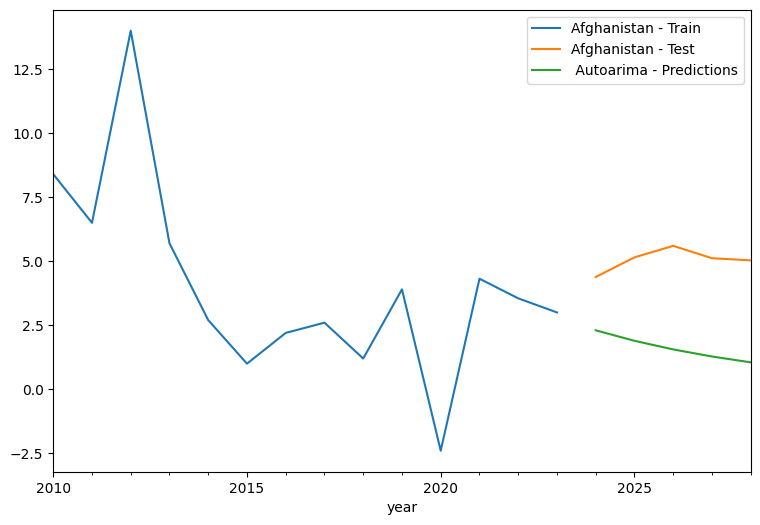

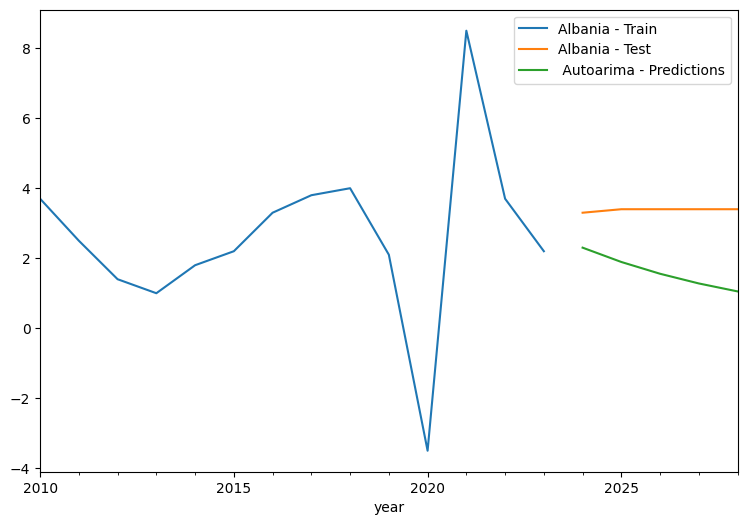

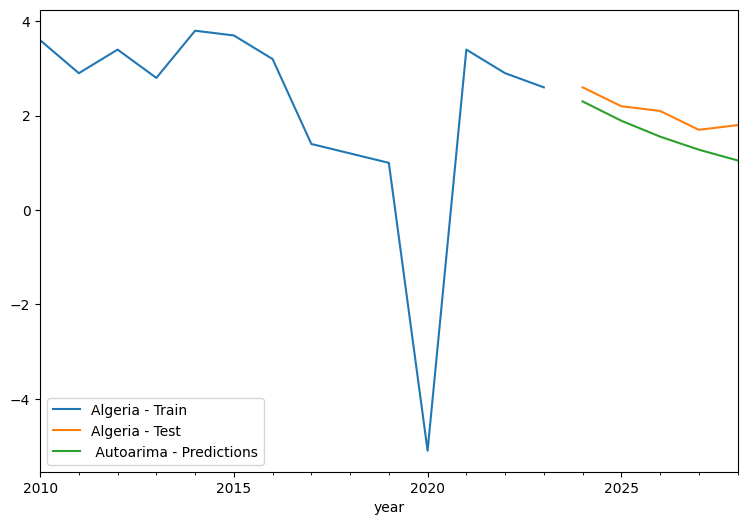

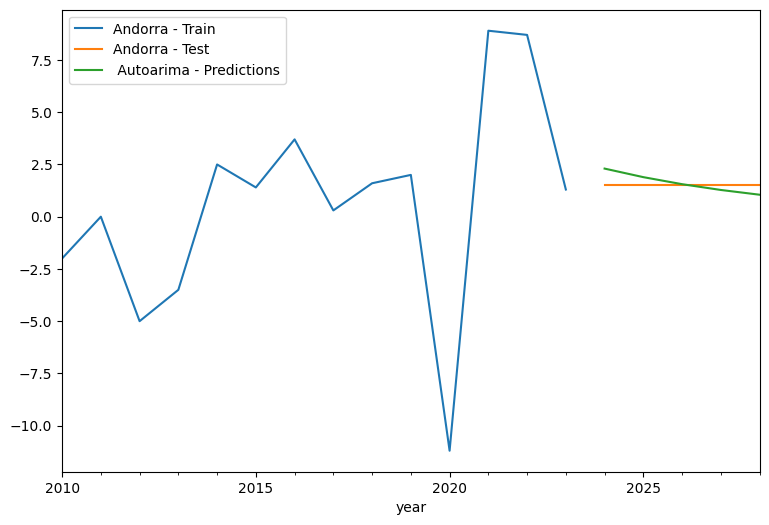

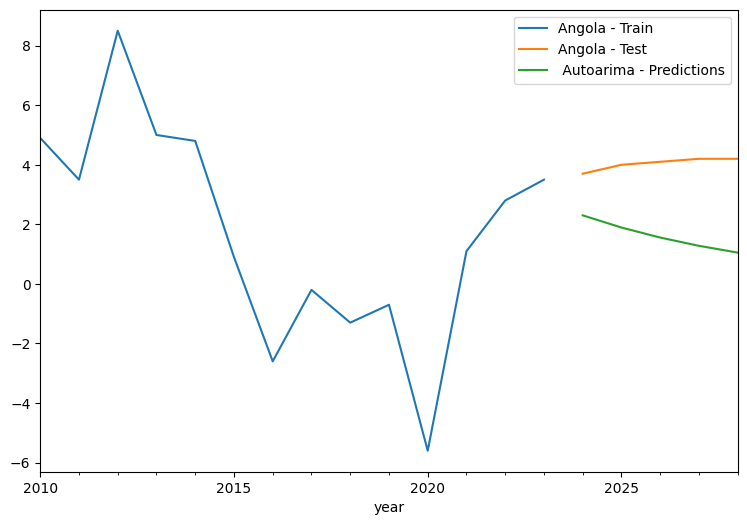

...

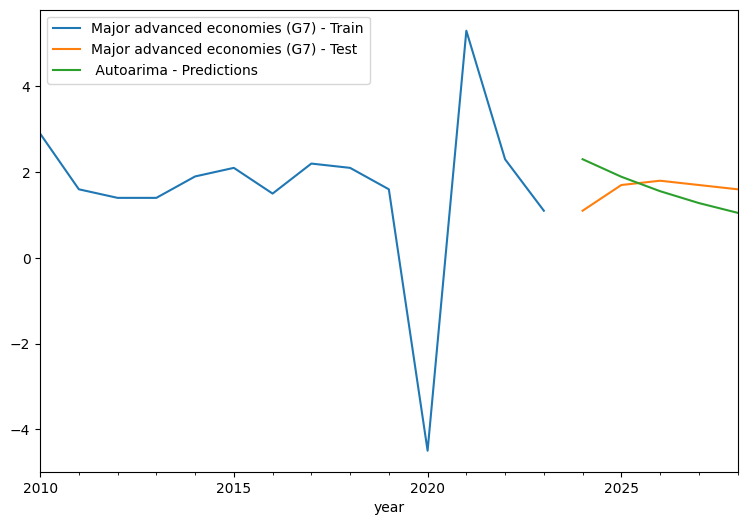

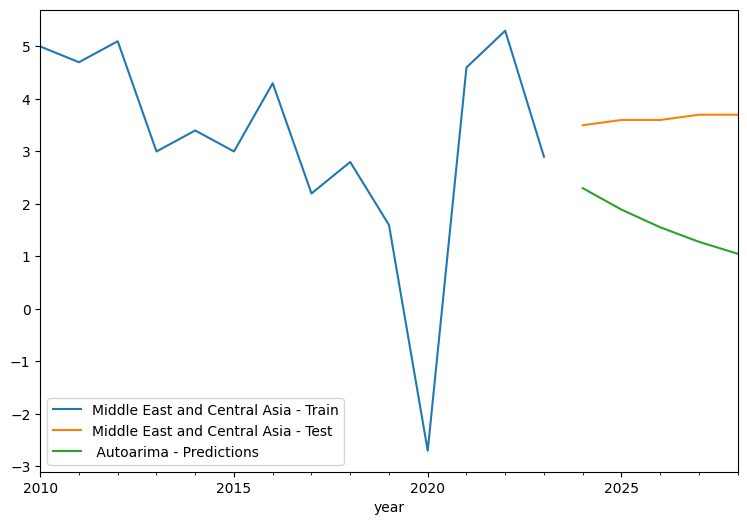

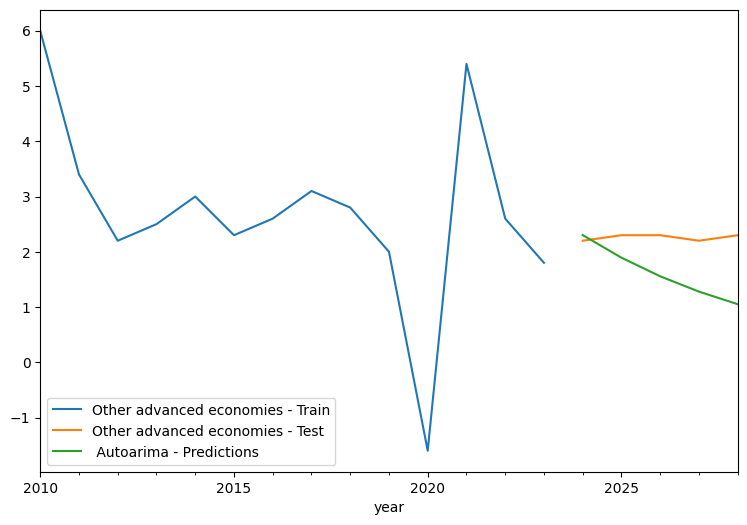

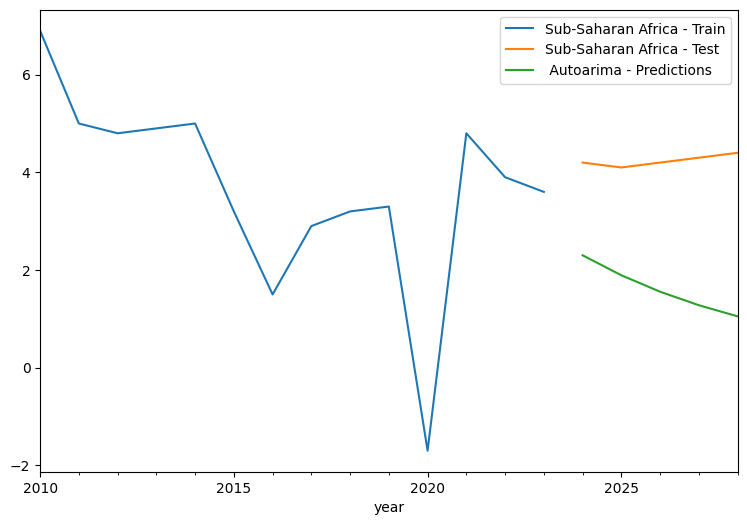

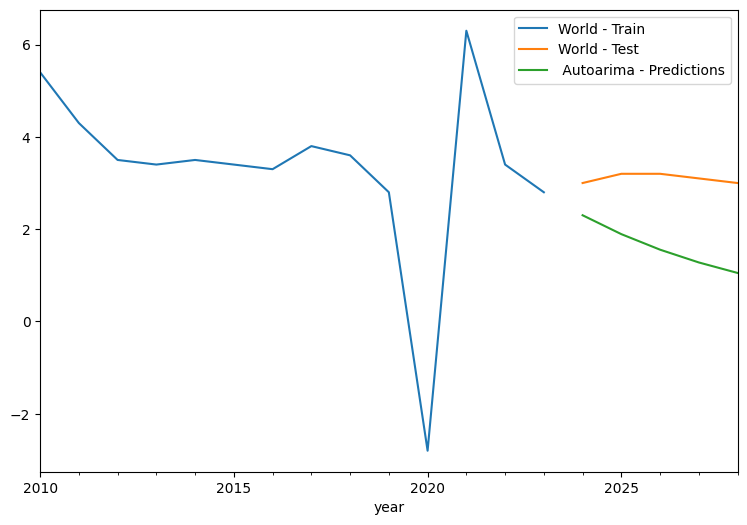

In [ ]:
# Visualization
#for country in df_model.columns: 
#    plt.figure()
#    train_data[country]['2010-01-01':].plot(figsize=(9, 6), label=f"{country} - Train", legend=True)
#    test_data[country].plot(label=f"{country} - Test", legend=True)
#    predictions_autoarima.plot(label=f" Autoarima - Predictions", legend=True)

### Metrics

In [ ]:
#loop for metrics mae, rmse and mape
metrics_predictions_autoarima = pd.DataFrame()
metrics_results = []
for country in df_model.columns:
    mae = (round(mean_absolute_error(test_data[country], df_pred_auto_arima[country].values),2))
    rmse = (round(np.sqrt(mean_squared_error(test_data[country], df_pred_auto_arima[country].values)),2))
    mape = (MAPE(test_data[country], df_pred_auto_arima[country].values))
    #print(f"Country: {country}")
    #print(f"MAE: {mae}")
    #print(f"RMSE: {rmse}")
    #print(f"MAPE: {mape}")
    #print("=============")
    metrics_results.append({
        "Country": country,
        "MAE": mae,
        "RMSE": rmse,
        "MAPE": mape
    })

metrics_predictions_autoarima = pd.DataFrame(metrics_results)
metrics_predictions_autoarima.to_csv('../../Projeto/Data/Metrics/metrics_predictions_autoarima.csv', index = True)


In [ ]:
## Export forecast

df_pred_auto_arima.to_csv('../../Projeto/Data/Output/predictions_autoarima.csv', index = True)

### Comparação de Métricas


DataFrame: autoarima
Métrica: MAE
mean      2.098202
median    1.630000
std       1.872705
Name: MAE, dtype: float64


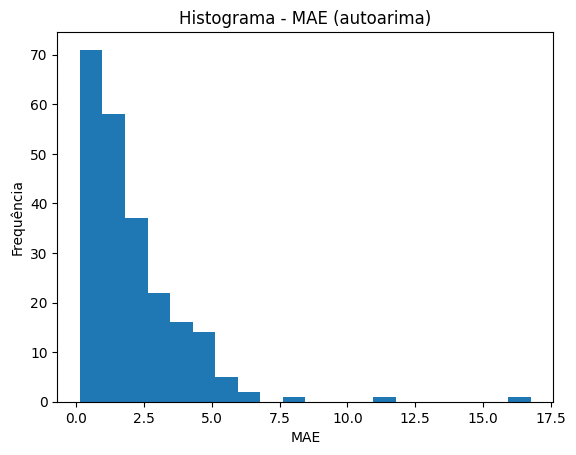



Top 20 MAE (autoarima):
                    Country    MAE   RMSE        MAPE
71                   Guyana  16.76  24.85   72.877979
96                  Lebanon  11.33  11.34  117.237431
118              Mozambique   8.04   9.38   77.640923
102               Macao SAR   6.44   8.91   72.419756
126                   Niger   5.96   6.42   78.023035
53        Equatorial Guinea   5.58   6.90  222.813422
14               Bangladesh   5.44   5.49   76.863391
144                  Rwanda   5.44   5.46   77.233072
199               Caribbean   5.38   7.64   59.076369
191                 Vietnam   5.14   5.16   76.161444
39   Dem. Rep. of the Congo   5.08   5.11   75.853305
57                 Ethiopia   5.06   5.11   75.573956
172                Tanzania   5.06   5.12   75.426702
182                  Uganda   5.02   5.09   75.267735
168                   Syria   4.98   7.54  624.253914
151                 Senegal   4.78   5.17   73.319700
30                 Cambodia   4.70   4.73   74.410205
45

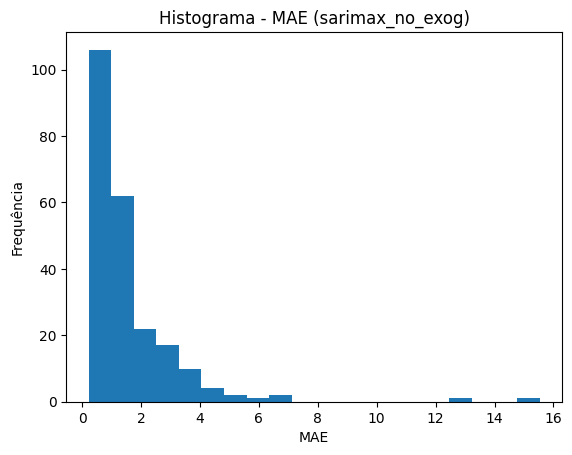



Top 20 MAE (sarimax_no_exog):
                    Country    MAE   RMSE         MAPE
71                   Guyana  15.53  24.16    47.834756
96                  Lebanon  12.58  12.60   130.168219
53        Equatorial Guinea   6.83   7.89   349.951157
118              Mozambique   6.79   8.37    60.251276
183                 Ukraine   5.87   5.89   195.813395
102               Macao SAR   5.19   8.29    45.795548
168                   Syria   5.00   7.25  1251.420640
126                   Niger   4.71   5.43    58.806995
199               Caribbean   4.65   6.92    42.868004
14               Bangladesh   4.19   4.22    59.226879
144                  Rwanda   4.19   4.23    59.154556
191                 Vietnam   3.89   3.91    57.499179
39   Dem. Rep. of the Congo   3.83   3.84    57.190099
57                 Ethiopia   3.81   3.85    56.776904
172                Tanzania   3.81   3.86    56.683615
182                  Uganda   3.77   3.80    56.663271
140             Puerto Rico   3.6

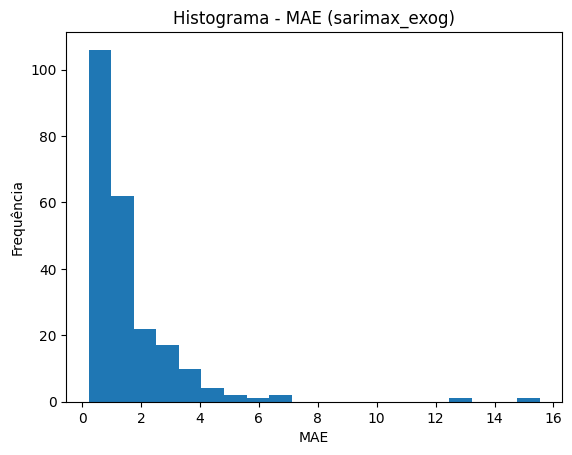



Top 20 MAE (sarimax_exog):
                    Country    MAE   RMSE         MAPE
71                   Guyana  15.53  24.16    47.834756
96                  Lebanon  12.58  12.60   130.168219
53        Equatorial Guinea   6.83   7.89   349.951157
118              Mozambique   6.79   8.37    60.251276
183                 Ukraine   5.87   5.89   195.813395
102               Macao SAR   5.19   8.29    45.795548
168                   Syria   5.00   7.25  1251.420640
126                   Niger   4.71   5.43    58.806995
199               Caribbean   4.65   6.92    42.868004
14               Bangladesh   4.19   4.22    59.226879
144                  Rwanda   4.19   4.23    59.154556
191                 Vietnam   3.89   3.91    57.499179
39   Dem. Rep. of the Congo   3.83   3.84    57.190099
57                 Ethiopia   3.81   3.85    56.776904
172                Tanzania   3.81   3.86    56.683615
182                  Uganda   3.77   3.80    56.663271
140             Puerto Rico   3.69  

In [ ]:

# Lista de métricas
metrics = ['MAE']

# Dicionário de DataFrames com seus respectivos nomes
dataframes = {
    'autoarima': metrics_predictions_autoarima,
    'sarimax_no_exog': metrics_predictions_sarimax_no_exog,
    'sarimax_exog': metrics_predictions_sarimax_exog
}

# Iterar sobre os DataFrames e as métricas
for df_name, df in dataframes.items():
    print(f"DataFrame: {df_name}")
    
    for metric in metrics:
        print(f"Métrica: {metric}")
        
        # Agregar as estatísticas
        aggregated = df[metric].agg(['mean', 'median', 'std'])
        print(aggregated)
        
        # Gerar histograma
        plt.hist(df[metric], bins=20)
        plt.title(f"Histograma - {metric} ({df_name})")
        plt.xlabel(metric)
        plt.ylabel("Frequência")
        plt.show()

        print("\n")

    # Mostrar os top 20 valores maiores de MAE
    top_20 = df.sort_values(by='MAE', ascending=False).head(20)
    print(f"Top 20 MAE ({df_name}):\n{top_20}\n")
